## P0 Détection d’intrusions cyber

## Groupe 08


L’objectif de ce projet est de mobiliser les
techniques d’analyse des réseaux afin d’enrichir l’ensemble d’attributs d’un
paquet par des mesures calculés à partir de la topologie du réseau d’interaction afin d’améliorer les performances des la classification automatique des
paquets

## 1- Récuperation et Etude du Dataset

In [1]:
import pandas as pd
import os
import numpy as np
import matplotlib.pyplot as plt
import igraph as ig
import seaborn as sns
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
from sklearn.svm import SVC
from sklearn.metrics import classification_report, confusion_matrix,ConfusionMatrixDisplay

In [2]:
nusw_nb15_df = pd.read_csv('data/NUSW-NB15_GT.csv')
nusw_nb15_df.head()

,Start time,Last time,Attack category,Attack subcategory,Protocol,Source IP,Source Port,Destination IP,Destination Port,Attack Name,Attack Reference,.
0,1421927414,1421927416,Reconnaissance,HTTP,tcp,175.45.176.0,13284,149.171.126.16,80,Domino Web Server Database Access: /doladmin.n...,-,.
1,1421927415,1421927415,Exploits,Unix 'r' Service,udp,175.45.176.3,21223,149.171.126.18,32780,Solaris rwalld Format String Vulnerability (ht...,CVE 2002-0573 (http://cve.mitre.org/cgi-bin/cv...,.
2,1421927416,1421927416,Exploits,Browser,tcp,175.45.176.2,23357,149.171.126.16,80,Windows Metafile (WMF) SetAbortProc() Code Exe...,CVE 2005-4560 (http://cve.mitre.org/cgi-bin/cv...,.
3,1421927417,1421927417,Exploits,Miscellaneous Batch,tcp,175.45.176.2,13792,149.171.126.16,5555,HP Data Protector Backup (https://strikecenter...,CVE 2011-1729 (http://cve.mitre.org/cgi-bin/cv...,.
4,1421927418,1421927418,Exploits,Cisco IOS,tcp,175.45.176.2,26939,149.171.126.10,80,Cisco IOS HTTP Authentication Bypass Level 64 ...,CVE 2001-0537 (http://cve.mitre.org/cgi-bin/cv...,.


In [3]:
train_set_source = pd.read_csv("data/traintestsetformsource/UNSW_NB15_training-set.csv")
test_set_source = pd.read_csv("data//traintestsetformsource/UNSW_NB15_testing-set.csv")
print(train_set_source.columns)
train_set_source.head()

Index(['id', 'dur', 'proto', 'service', 'state', 'spkts', 'dpkts', 'sbytes',
       'dbytes', 'rate', 'sttl', 'dttl', 'sload', 'dload', 'sloss', 'dloss',
       'sinpkt', 'dinpkt', 'sjit', 'djit', 'swin', 'stcpb', 'dtcpb', 'dwin',
       'tcprtt', 'synack', 'ackdat', 'smean', 'dmean', 'trans_depth',
       'response_body_len', 'ct_srv_src', 'ct_state_ttl', 'ct_dst_ltm',
       'ct_src_dport_ltm', 'ct_dst_sport_ltm', 'ct_dst_src_ltm',
       'is_ftp_login', 'ct_ftp_cmd', 'ct_flw_http_mthd', 'ct_src_ltm',
       'ct_srv_dst', 'is_sm_ips_ports', 'attack_cat', 'label'],
      dtype='object')


,id,dur,proto,service,state,spkts,dpkts,sbytes,dbytes,rate,...,ct_dst_sport_ltm,ct_dst_src_ltm,is_ftp_login,ct_ftp_cmd,ct_flw_http_mthd,ct_src_ltm,ct_srv_dst,is_sm_ips_ports,attack_cat,label
0,1,0.000011,udp,-,INT,2,0,496,0,90909.0902,...,1,2,0,0,0,1,2,0,Normal,0
1,2,0.000008,udp,-,INT,2,0,1762,0,125000.0003,...,1,2,0,0,0,1,2,0,Normal,0
2,3,0.000005,udp,-,INT,2,0,1068,0,200000.0051,...,1,3,0,0,0,1,3,0,Normal,0
3,4,0.000006,udp,-,INT,2,0,900,0,166666.6608,...,1,3,0,0,0,2,3,0,Normal,0
4,5,0.000010,udp,-,INT,2,0,2126,0,100000.0025,...,1,3,0,0,0,2,3,0,Normal,0


In [4]:
unsw_nb15_df1= pd.read_csv("data/UNSW-15/UNSW-NB15_1.csv",header=None)
unsw_nb15_df2= pd.read_csv("data/UNSW-15/UNSW-NB15_2.csv",header=None)
unsw_nb15_df3= pd.read_csv("data/UNSW-15/UNSW-NB15_3.csv",header=None)
unsw_nb15_df4= pd.read_csv("data/UNSW-15/UNSW-NB15_4.csv",header=None)
unsw_nb15_df1.head()

C:\Users\bertr\AppData\Local\Temp\ipykernel_28804\325129071.py:1: DtypeWarning: Columns (1,3,47) have mixed types. Specify dtype option on import or set low_memory=False.
  unsw_nb15_df1= pd.read_csv("data/UNSW-15/UNSW-NB15_1.csv",header=None)
C:\Users\bertr\AppData\Local\Temp\ipykernel_28804\325129071.py:2: DtypeWarning: Columns (3,39,47) have mixed types. Specify dtype option on import or set low_memory=False.
  unsw_nb15_df2= pd.read_csv("data/UNSW-15/UNSW-NB15_2.csv",header=None)


,0,1,2,3,4,5,6,7,8,9,...,39,40,41,42,43,44,45,46,47,48
0,59.166.0.0,1390,149.171.126.6,53,udp,CON,0.001055,132,164,31,...,0,3,7,1,3,1,1,1,NaN,0
1,59.166.0.0,33661,149.171.126.9,1024,udp,CON,0.036133,528,304,31,...,0,2,4,2,3,1,1,2,NaN,0
2,59.166.0.6,1464,149.171.126.7,53,udp,CON,0.001119,146,178,31,...,0,12,8,1,2,2,1,1,NaN,0
3,59.166.0.5,3593,149.171.126.5,53,udp,CON,0.001209,132,164,31,...,0,6,9,1,1,1,1,1,NaN,0
4,59.166.0.3,49664,149.171.126.0,53,udp,CON,0.001169,146,178,31,...,0,7,9,1,1,1,1,1,NaN,0


In [5]:
# List of dataframes to concatenate
dfs = [unsw_nb15_df1, unsw_nb15_df2, unsw_nb15_df3, unsw_nb15_df4]

# Concatenate the dataframes
unsw_nb15_all_df = pd.concat(dfs, ignore_index=True)
unsw_nb15_all_df.head()

,0,1,2,3,4,5,6,7,8,9,...,39,40,41,42,43,44,45,46,47,48
0,59.166.0.0,1390,149.171.126.6,53,udp,CON,0.001055,132,164,31,...,0,3,7,1,3,1,1,1,NaN,0
1,59.166.0.0,33661,149.171.126.9,1024,udp,CON,0.036133,528,304,31,...,0,2,4,2,3,1,1,2,NaN,0
2,59.166.0.6,1464,149.171.126.7,53,udp,CON,0.001119,146,178,31,...,0,12,8,1,2,2,1,1,NaN,0
3,59.166.0.5,3593,149.171.126.5,53,udp,CON,0.001209,132,164,31,...,0,6,9,1,1,1,1,1,NaN,0
4,59.166.0.3,49664,149.171.126.0,53,udp,CON,0.001169,146,178,31,...,0,7,9,1,1,1,1,1,NaN,0


In [6]:
# list of columns get from documentatio,
column_names = ['srcip', 'sport', 'dstip', 'dsport', 'proto', 'state', 'dur', 'sbytes', 'dbytes', 'sttl', 'dttl', 'sloss', 'dloss', 'service', 'sload', 'dload', 'spkts', 'dpkts', 'swin', 'dwin', 'stcpb', 'dtcpb', 'smeansz', 'dmeansz', 'trans_depth', 'res_bdy_len', 'sjit', 'djit', 'stime', 'ltime', 'sintpkt', 'dintpkt', 'tcprtt', 'synack', 'ackdat', 'is_sm_ips_ports', 'ct_state_ttl', 'ct_flw_http_mthd', 'is_ftp_login', 'ct_ftp_cmd','ct_srv_src', 'ct_srv_dst', 'ct_dst_ltm', 'ct_src_ltm', 'ct_src_dport_ltm', 'ct_dst_sport_ltm', 'ct_dst_src_ltm', 'attack_cat', 'Label']
# renames column names
unsw_nb15_all_df.columns = column_names
unsw_nb15_all_df.head()

,srcip,sport,dstip,dsport,proto,state,dur,sbytes,dbytes,sttl,...,ct_ftp_cmd,ct_srv_src,ct_srv_dst,ct_dst_ltm,ct_src_ltm,ct_src_dport_ltm,ct_dst_sport_ltm,ct_dst_src_ltm,attack_cat,Label
0,59.166.0.0,1390,149.171.126.6,53,udp,CON,0.001055,132,164,31,...,0,3,7,1,3,1,1,1,NaN,0
1,59.166.0.0,33661,149.171.126.9,1024,udp,CON,0.036133,528,304,31,...,0,2,4,2,3,1,1,2,NaN,0
2,59.166.0.6,1464,149.171.126.7,53,udp,CON,0.001119,146,178,31,...,0,12,8,1,2,2,1,1,NaN,0
3,59.166.0.5,3593,149.171.126.5,53,udp,CON,0.001209,132,164,31,...,0,6,9,1,1,1,1,1,NaN,0
4,59.166.0.3,49664,149.171.126.0,53,udp,CON,0.001169,146,178,31,...,0,7,9,1,1,1,1,1,NaN,0


In [7]:
unsw_nb15_df4.iloc[:,-2].unique()

array([nan, 'Exploits', ' Fuzzers ', 'Backdoor', 'DoS', 'Generic',
       ' Reconnaissance ', ' Shellcode ', 'Analysis', 'Worms'],
      dtype=object)

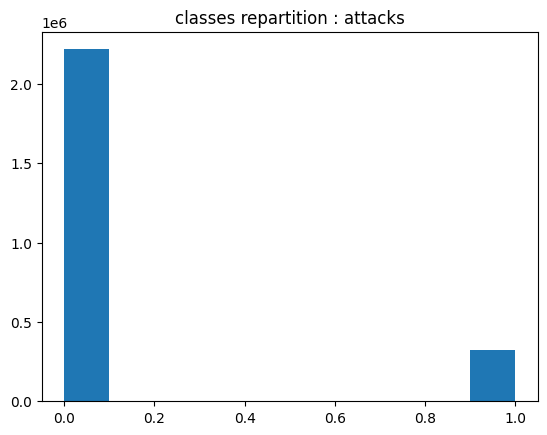

In [8]:
plt.hist(unsw_nb15_all_df['Label'])
plt.title('classes repartition : attacks')
plt.show()

La Répartition des classes est desequilibrée
Nous allons prendre les 2607 attaques et choisir aléatoirement 2607 normal pour la suite

In [9]:
# Séparer les instances en attaques et normales
attaques_df = unsw_nb15_all_df[unsw_nb15_all_df['Label'] == 1]
normales_df = unsw_nb15_all_df[unsw_nb15_all_df['Label'] == 0]

# Sous-échantillonner les instances normales pour obtenir 2500 instances
normales_sample_df = normales_df.sample(n=2607, random_state=42)  # random_state assure la reproductibilité

# Faire de même pour les attaques si elles sont plus nombreuses que 2500
attaques_sample_df = attaques_df.sample(n=2607, random_state=42)

# Combiner les instances sous-échantillonnées pour obtenir un ensemble de données équilibré
equilibre_df = pd.concat([attaques_sample_df, normales_sample_df])

# Mélanger les données pour s'assurer que les classes sont bien mélangées
equilibre_df = equilibre_df.sample(frac=1, random_state=42).reset_index(drop=True)

# Afficher les premières lignes du DataFrame équilibré pour vérification
print(equilibre_df.shape)


(5214, 49)


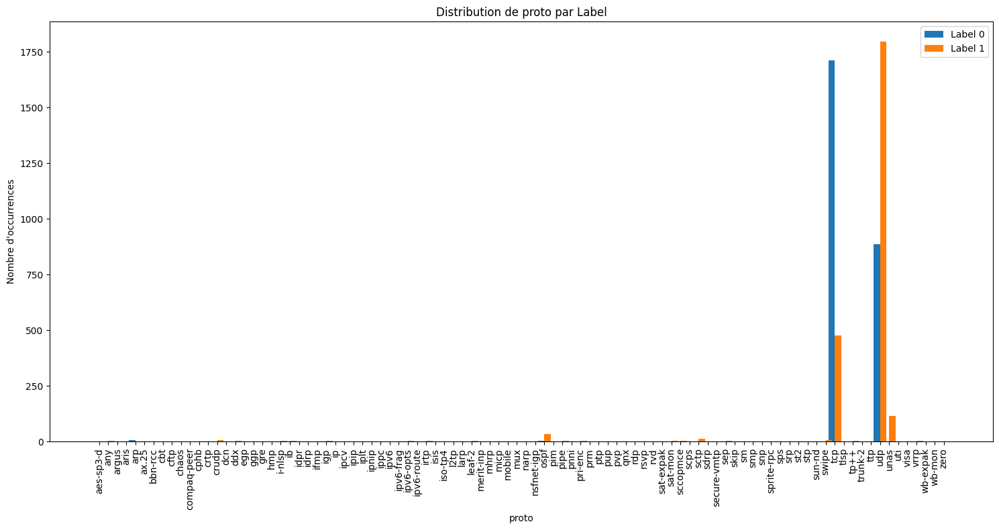

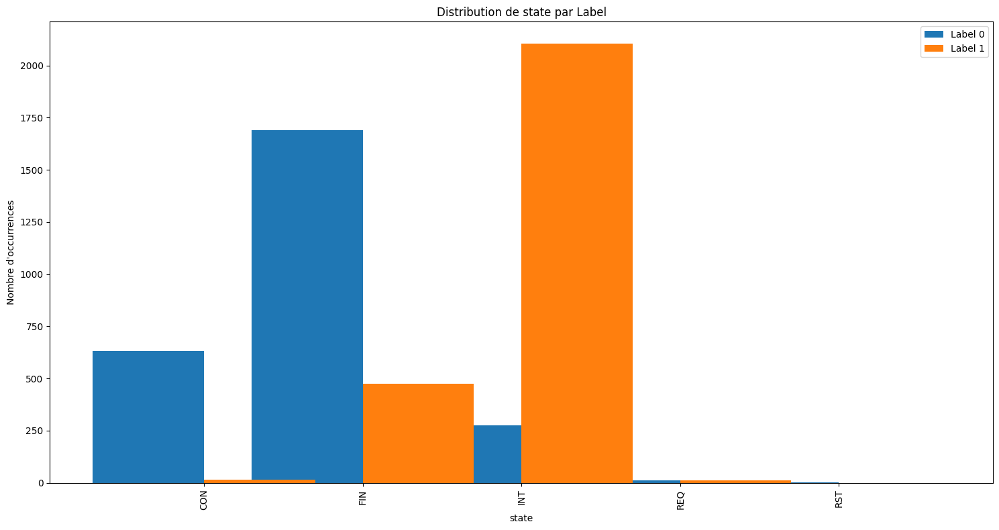

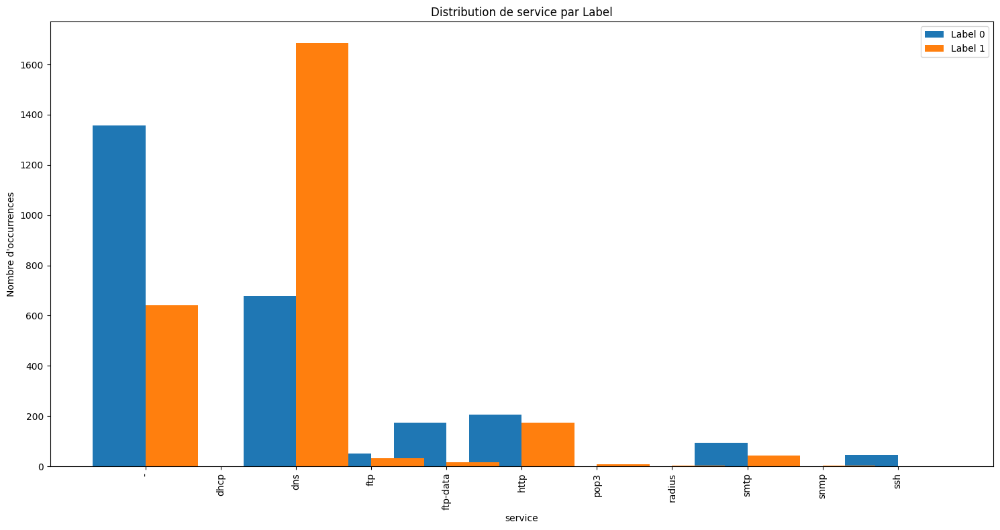

In [10]:

# Vos variables nominales
var_nominal = ['proto', 'state', 'service']

# Pour chaque variable nominale, tracer la distribution des labels
for var in var_nominal:
    plt.figure(figsize=(15, 8))
    
    # Calculer le nombre d'occurrences pour chaque catégorie et label
    counts = equilibre_df.groupby([var, 'Label']).size().unstack(fill_value=0)
    
    # Préparation des indices pour le tracé des barres
    index = np.arange(len(counts.index))
    bar_width = 0.35*2
    # Tracé des barres
    plt.bar(index - bar_width/2, counts[0], bar_width, label='Label 0')
    plt.bar(index + bar_width/2, counts[1], bar_width, label='Label 1')
    
    # Ajout de titres et de labels
    plt.xlabel(var)
    plt.ylabel('Nombre d\'occurrences')
    plt.title(f'Distribution de {var} par Label')
    plt.xticks(index, counts.index, rotation=90)  # Rotation à 90 degrés pour plus de clarté
    plt.legend()
    
    # Ajustement de l'espacement pour éviter le chevauchement
    plt.tight_layout()
    
    # Affichage du graphique
    plt.show()


In [11]:
# Liste des variables
variables_int = ['ct_dst_sport_ltm', 'ct_dst_src_ltm', 'ct_src_dport_ltm', 'ct_src_ltm', 'ct_dst_ltm', 
             'ct_srv_dst', 'ct_srv_src', 'ct_ftp_cmd', 'ct_flw_http_mthd', 'ct_state_ttl', 'ackdat', 
             'synack', 'tcprtt', 'dintpkt', 'sintpkt', 'ltime', 'stime', 'djit', 'sjit', 'res_bdy_len', 
             'trans_depth', 'dmeansz', 'smeansz', 'dtcpb', 'stcpb', 'dwin', 'swin', 'dpkts', 'spkts', 
             'dload', 'sload', 'dloss', 'sloss', 'dttl', 'sttl', 'dbytes', 'dur']

# Vérifier les types de ces colonnes

equilibre_df['ct_ftp_cmd'] = pd.to_numeric(equilibre_df['ct_ftp_cmd'], errors='coerce')


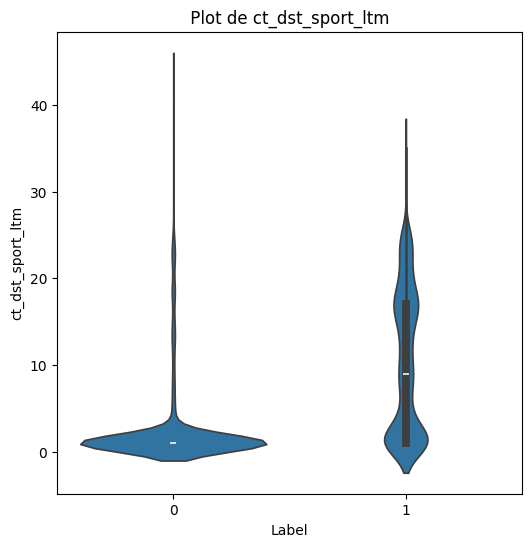

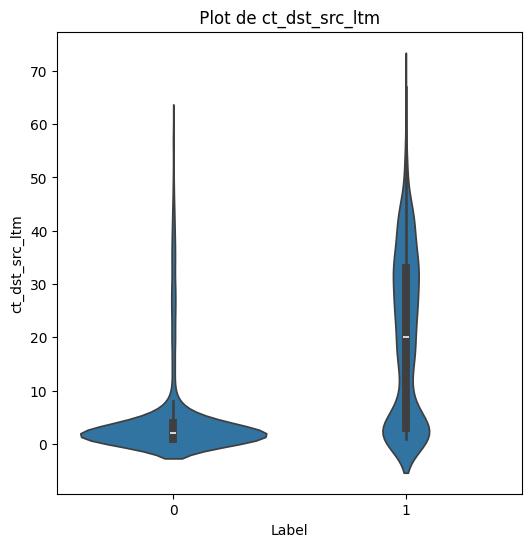

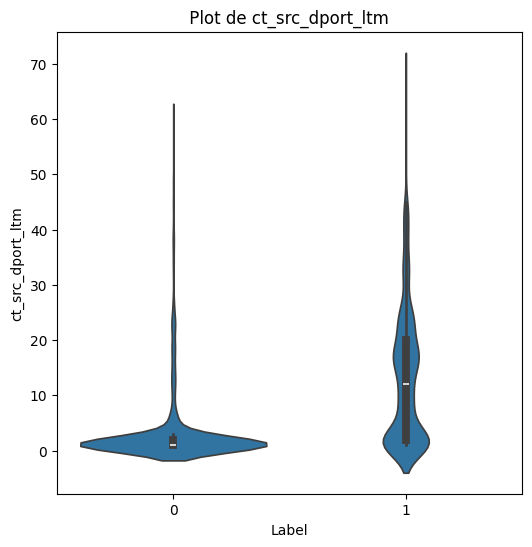

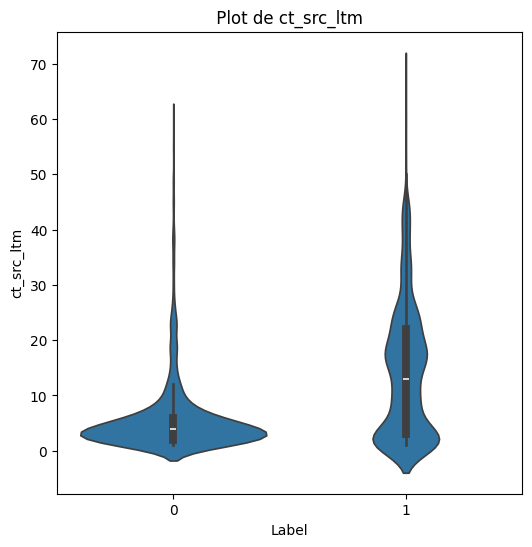

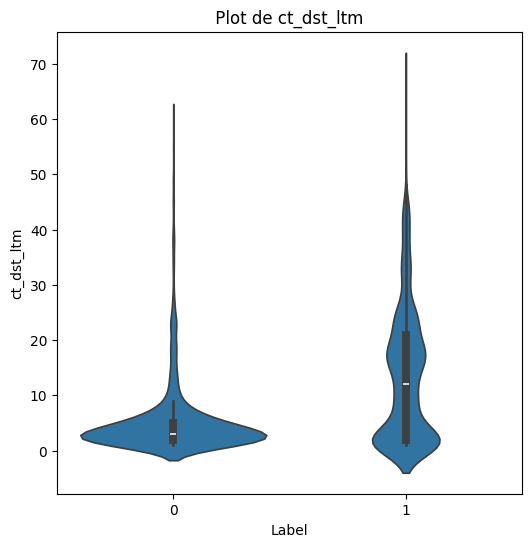

...

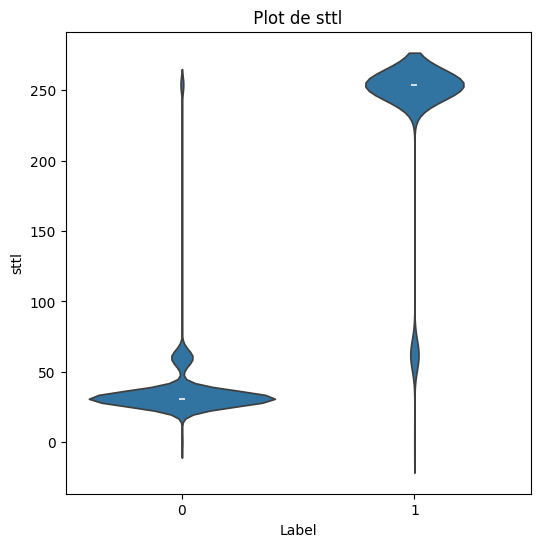

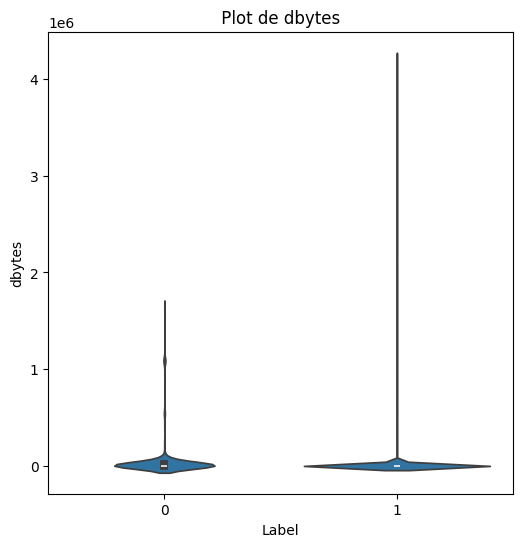

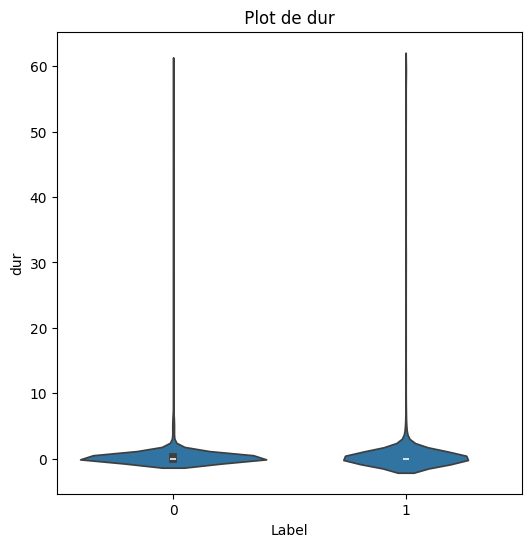

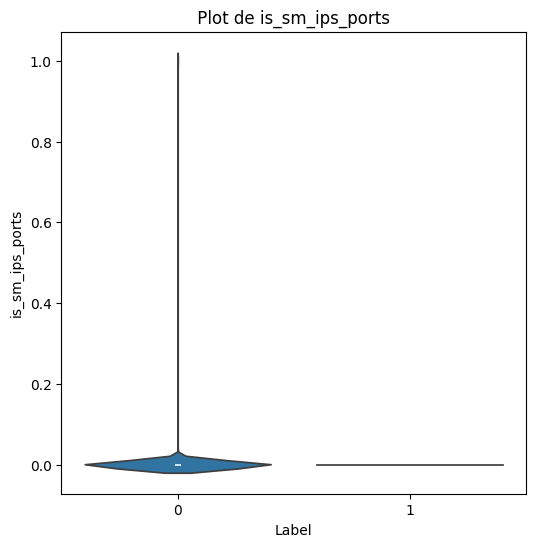

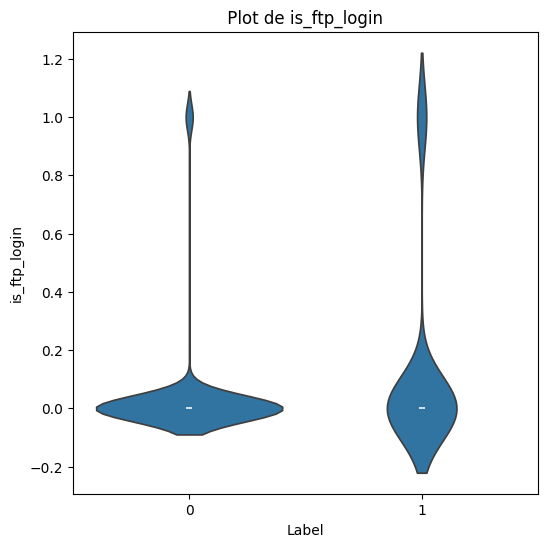

In [12]:
# Liste des variables à visualiser
variables_int = ['ct_dst_sport_ltm', 'ct_dst_src_ltm','ct_src_dport_ltm','ct_src_ltm','ct_dst_ltm','ct_srv_dst','ct_srv_src','ct_ftp_cmd','ct_flw_http_mthd','ct_state_ttl','ackdat','synack','tcprtt','dintpkt',
             'sintpkt','ltime','stime','djit','sjit','res_bdy_len','trans_depth','dmeansz','smeansz','dtcpb','stcpb','dwin','swin','dpkts','spkts','dload','sload','dloss','sloss','dttl','sttl','dbytes','dur','is_sm_ips_ports','is_ftp_login']

# Création d'un violon plot pour chaque variable
for var in variables_int:
    plt.figure(figsize=(6, 6))
    sns.violinplot(x='Label', y=var, data=equilibre_df)
    plt.title(f' Plot de {var} ')
    plt.show()


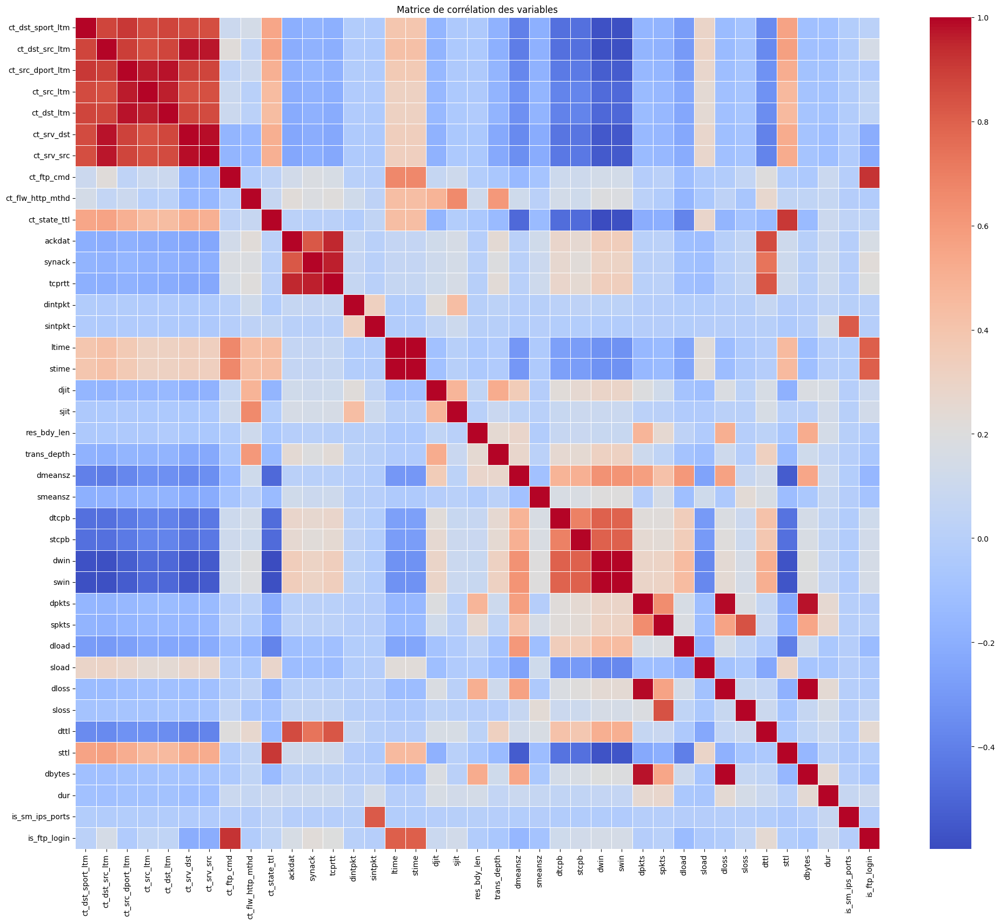

In [13]:


# Calcul de la matrice de corrélation
correlation_matrix = equilibre_df[variables_int].corr()

# Création de la carte de chaleur
plt.figure(figsize=(24, 20))
sns.heatmap(correlation_matrix, annot=False, cmap='coolwarm', linewidths=.5)
plt.title('Matrice de corrélation des variables')
plt.show()


{'dbytes', 'ct_dst_ltm', 'is_sm_ips_ports', 'swin', 'dloss', 'ct_srv_src', 'synack', 'dttl', 'ct_src_dport_ltm', 'ct_src_ltm', 'sloss', 'is_ftp_login', 'stime', 'sttl', 'tcprtt', 'ct_srv_dst', 'ct_dst_src_ltm'}


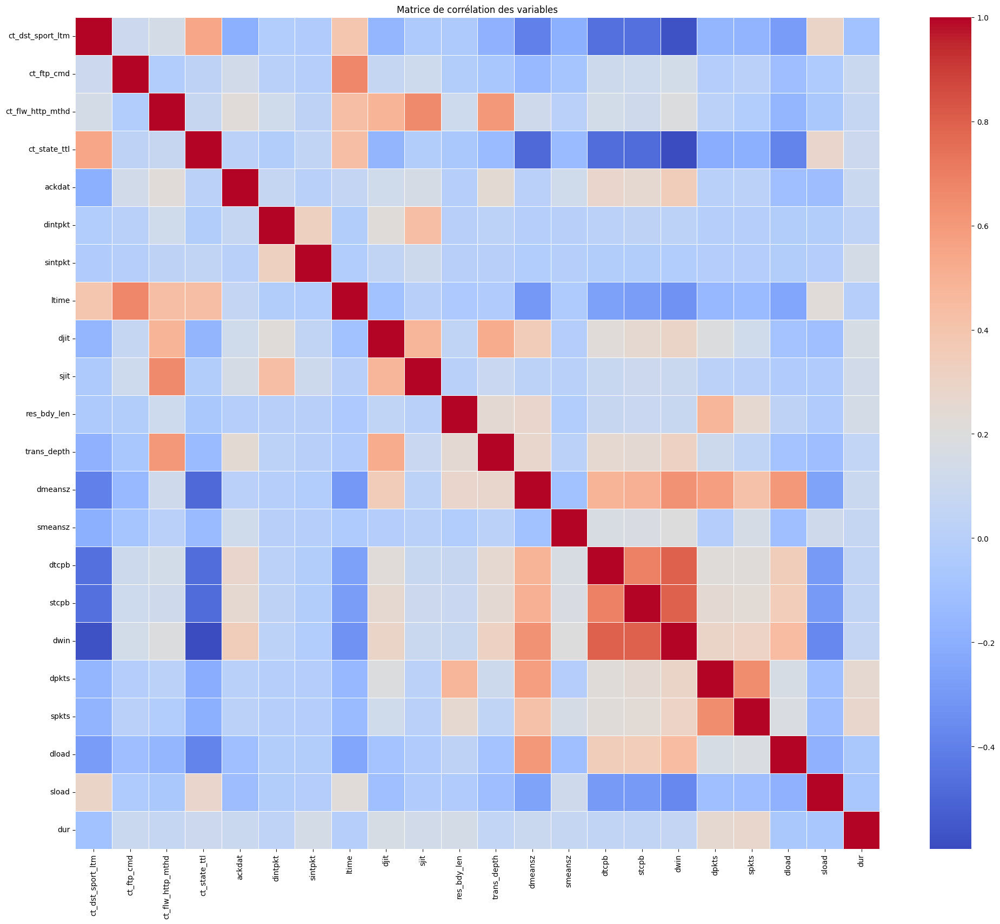

Index(['ct_dst_sport_ltm', 'ct_ftp_cmd', 'ct_flw_http_mthd', 'ct_state_ttl',
       'ackdat', 'dintpkt', 'sintpkt', 'ltime', 'djit', 'sjit', 'res_bdy_len',
       'trans_depth', 'dmeansz', 'smeansz', 'dtcpb', 'stcpb', 'dwin', 'dpkts',
       'spkts', 'dload', 'sload', 'dur'],
      dtype='object')

In [14]:

# Calcul de la matrice de corrélation
corr_matrix = equilibre_df[variables_int].corr()

# Trouver les paires de variables fortement corrélées (au-dessus de 0.8)
to_drop = set()
for i in range(len(corr_matrix.columns)):
    for j in range(i+1, len(corr_matrix.columns)):
        if abs(corr_matrix.iloc[i, j]) > 0.8:
            # Si la corrélation est forte, ajouter l'un des deux à la liste des colonnes à supprimer
            to_drop.add(corr_matrix.columns[j])

# Afficher les paires de variables fortement corrélées
print(to_drop)

# Éliminer les variables fortement corrélées
unsw_nb15_all_df_reduced = equilibre_df[variables_int].drop(columns=to_drop)

new_colonnes = unsw_nb15_all_df_reduced.columns

# Calcul de la matrice de corrélation
correlation_matrix = unsw_nb15_all_df_reduced.corr()

# Création de la carte de chaleur
plt.figure(figsize=(24, 20))
sns.heatmap(correlation_matrix, annot=False, cmap='coolwarm', linewidths=.5)
plt.title('Matrice de corrélation des variables')
plt.show()

# Afficher les colonnes restantes
unsw_nb15_all_df_reduced.columns

In [15]:
int_keep_columns = unsw_nb15_all_df_reduced.columns
final_df = unsw_nb15_all_df_reduced
final_df['Label'] = equilibre_df['Label']
# add nominal columns
final_df['proto'] = equilibre_df['proto']
final_df['state'] = equilibre_df['state']
final_df['service'] = equilibre_df['service']
final_df['service'] = equilibre_df['service']
int_keep_columns


Index(['ct_dst_sport_ltm', 'ct_ftp_cmd', 'ct_flw_http_mthd', 'ct_state_ttl',
       'ackdat', 'dintpkt', 'sintpkt', 'ltime', 'djit', 'sjit', 'res_bdy_len',
       'trans_depth', 'dmeansz', 'smeansz', 'dtcpb', 'stcpb', 'dwin', 'dpkts',
       'spkts', 'dload', 'sload', 'dur'],
      dtype='object')

## 2- Construire un Network

Nous proposons d'utiliser le dataset equilibré pour  la suite de notre analyse.

In [94]:
# Step 3: Create unique identifiers for each node
df =unsw_nb15_all_df
df['source_node'] = unsw_nb15_all_df['srcip'].astype(str) + ':' + unsw_nb15_all_df['sport'].astype(str)
df['destination_node'] = unsw_nb15_all_df['dstip'].astype(str) + ':' + unsw_nb15_all_df['dsport'].astype(str)

# Step 4: Create a list of tuples representing the edges
edges = list(zip(df['source_node'], df['destination_node']))

# Step 5: Build the Network of all data
g = ig.Graph.TupleList(edges, directed=True)
print(g.summary())

# main_graph est la version simplifiée de g (sans les boucles et les arêtes multiples entre les mêmes nœuds)
main_graph = g.copy()
main_graph.simplify()
print(main_graph.summary())

IGRAPH DN-- 1112287 2540047 -- 
+ attr: name (v)
IGRAPH DN-- 1112287 1956252 -- 
+ attr: name (v)


In [95]:
# Trouver toutes les composantes connexes du graphe
components = main_graph.components()

# Récupérer la plus grande composante connexe
largest_component = components.giant()

# Afficher un résumé de la plus grande composante connexe
print(largest_component.summary())


IGRAPH DN-- 1298 3763 -- 
+ attr: name (v)


In [17]:
print(equilibre_df.columns)

Index(['srcip', 'sport', 'dstip', 'dsport', 'proto', 'state', 'dur', 'sbytes',
       'dbytes', 'sttl', 'dttl', 'sloss', 'dloss', 'service', 'sload', 'dload',
       'spkts', 'dpkts', 'swin', 'dwin', 'stcpb', 'dtcpb', 'smeansz',
       'dmeansz', 'trans_depth', 'res_bdy_len', 'sjit', 'djit', 'stime',
       'ltime', 'sintpkt', 'dintpkt', 'tcprtt', 'synack', 'ackdat',
       'is_sm_ips_ports', 'ct_state_ttl', 'ct_flw_http_mthd', 'is_ftp_login',
       'ct_ftp_cmd', 'ct_srv_src', 'ct_srv_dst', 'ct_dst_ltm', 'ct_src_ltm',
       'ct_src_dport_ltm', 'ct_dst_sport_ltm', 'ct_dst_src_ltm', 'attack_cat',
       'Label'],
      dtype='object')


In [18]:
# Step 3: Create unique identifiers for each node
df =equilibre_df
df['source_node'] = equilibre_df['srcip'].astype(str) + ':' + equilibre_df['sport'].astype(str)
df['destination_node'] = equilibre_df['dstip'].astype(str) + ':' + equilibre_df['dsport'].astype(str)

# Step 4: Create a list of tuples representing the edges
edges = list(zip(df['source_node'], df['destination_node']))

# Step 5: Build the Network of all data
g = ig.Graph.TupleList(edges, directed=True)
print(g.summary())

# main_graph est la version simplifiée de g (sans les boucles et les arêtes multiples entre les mêmes nœuds)
main_graph = g.copy()
main_graph.simplify()
print(main_graph.summary())

IGRAPH DN-- 4238 5214 -- 
+ attr: name (v)
IGRAPH DN-- 4238 2991 -- 
+ attr: name (v)


IGRAPH DN-- 2 2 -- 
+ attr: name (v)


In [96]:
# Personnaliser le style du graphe
visual_style = {}

# Taille de la fenêtre de visualisation
visual_style["bbox"] = (1200, 1200)
# Marge autour du graphe
visual_style["margin"] = 50

# Style des sommets
visual_style["vertex_size"] = 5  # Taille des sommets
visual_style["vertex_color"] = "blue"  # Couleur des sommets

# Style des arêtes
visual_style["edge_color"] = "grey"  # Couleur des arêtes
visual_style["edge_width"] = 1  # Épaisseur des arêtes

# Disposition des sommets dans l'espace 2D
# 'layout' peut être 'auto', 'graphopt','kk' (Kamada-Kaway), etc.
visual_style["layout"] = largest_component.layout("graphopt")

# Afficher le graphe
ig.plot(largest_component, **visual_style)

In [19]:
# Personnaliser le style du graphe
visual_style = {}

# Taille de la fenêtre de visualisation
visual_style["bbox"] = (1200, 1200)
# Marge autour du graphe
visual_style["margin"] = 50

# Style des sommets
visual_style["vertex_size"] = 5  # Taille des sommets
visual_style["vertex_color"] = "blue"  # Couleur des sommets

# Style des arêtes
visual_style["edge_color"] = "grey"  # Couleur des arêtes
visual_style["edge_width"] = 1  # Épaisseur des arêtes

# Disposition des sommets dans l'espace 2D
# 'layout' peut être 'auto', 'graphopt','kk' (Kamada-Kaway), etc.
visual_style["layout"] = main_graph.layout("graphopt")

# Afficher le graphe
ig.plot(main_graph, **visual_style)

In [20]:
# Personnaliser le style du graphe
visual_style = {}

# Taille de la fenêtre de visualisation
visual_style["bbox"] = (1200, 1200)
# Marge autour du graphe
visual_style["margin"] = 50

# Style des sommets
visual_style["vertex_size"] = 5  # Taille des sommets
visual_style["vertex_color"] = "blue"  # Couleur des sommets

# Style des arêtes
visual_style["edge_color"] = "grey"  # Couleur des arêtes
visual_style["edge_width"] = 1  # Épaisseur des arêtes

# Disposition des sommets dans l'espace 2D
# 'layout' peut être 'auto', 'graphopt','kk' (Kamada-Kaway), etc.
visual_style["layout"] = g.layout("graphopt")

# Afficher le graphe
ig.plot(g, **visual_style)

# 3- Faire une première prédiction (classifications)

In [21]:
# dataset
print(final_df.columns)
print(final_df.head())

Index(['ct_dst_sport_ltm', 'ct_ftp_cmd', 'ct_flw_http_mthd', 'ct_state_ttl',
       'ackdat', 'dintpkt', 'sintpkt', 'ltime', 'djit', 'sjit', 'res_bdy_len',
       'trans_depth', 'dmeansz', 'smeansz', 'dtcpb', 'stcpb', 'dwin', 'dpkts',
       'spkts', 'dload', 'sload', 'dur', 'Label', 'proto', 'state', 'service'],
      dtype='object')
   ct_dst_sport_ltm  ct_ftp_cmd  ct_flw_http_mthd  ct_state_ttl    ackdat  \
0                 1         NaN               NaN             1  0.064124   
1                 7         NaN               NaN             2  0.000000   
2                 1         0.0               0.0             0  0.000130   
3                 1         NaN               NaN             0  0.000139   
4                18         NaN               NaN             2  0.000000   

     dintpkt    sintpkt       ltime        djit         sjit  ...  dwin  \
0  96.835000  77.020778  1424241448  144.864234  4810.386718  ...   255   
1   0.000000   0.004000  1424231886    0.000000   

In [22]:

# Initialisation du MinMaxScaler.
scaler = MinMaxScaler()

# Normalisation des colonnes numériques spécifiées dans variables.
final_df[int_keep_columns] = scaler.fit_transform(final_df[int_keep_columns])

# Affichage des premières lignes du DataFrame normalisé pour vérifier.
print(final_df.head())


   ct_dst_sport_ltm  ct_ftp_cmd  ct_flw_http_mthd  ct_state_ttl    ackdat  \
0          0.000000         NaN               NaN      0.166667  0.323339   
1          0.139535         NaN               NaN      0.333333  0.000000   
2          0.000000         0.0               0.0      0.000000  0.000656   
3          0.000000         NaN               NaN      0.000000  0.000701   
4          0.395349         NaN               NaN      0.333333  0.000000   

    dintpkt       sintpkt     ltime      djit      sjit  ...  dwin     dpkts  \
0  0.002168  1.283663e-03  0.991169  0.003323  0.004112  ...   1.0  0.002558   
1  0.000000  6.666582e-08  0.987073  0.000000  0.000000  ...   0.0  0.000000   
2  0.000012  9.487113e-06  0.015690  0.000730  0.000028  ...   1.0  0.025575   
3  0.000017  1.489314e-05  0.981953  0.000032  0.000051  ...   1.0  0.005754   
4  0.000000  4.999937e-08  0.987152  0.000000  0.000000  ...   0.0  0.000000   

      spkts     dload     sload           dur  Label  pr

In [23]:
# handle null values
# show the number of null values in each column
print(final_df.isnull().sum())

ct_dst_sport_ltm       0
ct_ftp_cmd          3755
ct_flw_http_mthd    3555
ct_state_ttl           0
ackdat                 0
dintpkt                0
sintpkt                0
ltime                  0
djit                   0
sjit                   0
res_bdy_len            0
trans_depth            0
dmeansz                0
smeansz                0
dtcpb                  0
stcpb                  0
dwin                   0
dpkts                  0
spkts                  0
dload                  0
sload                  0
dur                    0
Label                  0
proto                  0
state                  0
service                0
dtype: int64


In [24]:
# drop columns with lots of null values 
final_df = final_df.drop(['ct_ftp_cmd'], axis=1)
final_df = final_df.drop(['ct_flw_http_mthd'], axis=1)

In [25]:

# Séparation des données en ensembles d'entraînement et de test
X = final_df.drop(columns='Label')
y = final_df['Label']

# Création de variables dummy pour les variables catégorielles
X_dummies = pd.get_dummies(X, drop_first=True)

# Séparation des données en ensembles d'entraînement et de test après avoir créé des variables dummy
X_train, X_test, y_train, y_test = train_test_split(X_dummies, y, test_size=0.2, random_state=42)

# Entraînement du modèle SVM avec un noyau radial ('rbf' est le choix par défaut)
svm_model = SVC(kernel='rbf')
svm_model.fit(X_train, y_train)

# Prédictions sur l'ensemble de test
y_pred = svm_model.predict(X_test)

# Évaluation du modèle
print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred))
print("\nClassification Report:")
print(classification_report(y_test, y_pred))



Confusion Matrix:
[[514   6]
 [  0 523]]

Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.99      0.99       520
           1       0.99      1.00      0.99       523

    accuracy                           0.99      1043
   macro avg       0.99      0.99      0.99      1043
weighted avg       0.99      0.99      0.99      1043



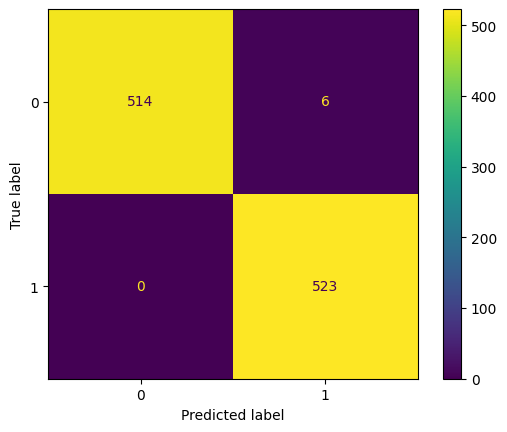

In [26]:

# Créez une matrice de confusion
cm = confusion_matrix(y_test, y_pred)
# Afficher la matrice de confusion
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=svm_model.classes_)
disp.plot()



## 4- Générer les mesures de centralités & classification

```
pour le noeud de destination et source (9*2)

       'degree': graph.degree(),
        'closeness_centrality': graph.closeness(),
        'betweenness_centrality': graph.betweenness(),
        'eigenvector_centrality': graph.eigenvector_centrality(),
        'clustering_coefficient': graph.transitivity_local_undirected(mode='zero'),
        'pagerank': graph.pagerank(),
        'coreness': graph.coreness(),  # K-core centrality
        # Pour les mesures spectrales comme 'hits', vous pouvez avoir besoin de décomposer les résultats en autorité et hub
        'authority_score': graph.authority_score(),
        'hub_score': graph.hub_score()

```

In [27]:
print(final_df.head())

   ct_dst_sport_ltm  ct_state_ttl    ackdat   dintpkt       sintpkt     ltime  \
0          0.000000      0.166667  0.323339  0.002168  1.283663e-03  0.991169   
1          0.139535      0.333333  0.000000  0.000000  6.666582e-08  0.987073   
2          0.000000      0.000000  0.000656  0.000012  9.487113e-06  0.015690   
3          0.000000      0.000000  0.000701  0.000017  1.489314e-05  0.981953   
4          0.395349      0.333333  0.000000  0.000000  4.999937e-08  0.987152   

       djit      sjit  res_bdy_len  trans_depth  ...  dwin     dpkts  \
0  0.003323  0.004112          0.0          0.0  ...   1.0  0.002558   
1  0.000000  0.000000          0.0          0.0  ...   0.0  0.000000   
2  0.000730  0.000028          0.0          0.0  ...   1.0  0.025575   
3  0.000032  0.000051          0.0          0.0  ...   1.0  0.005754   
4  0.000000  0.000000          0.0          0.0  ...   0.0  0.000000   

      spkts     dload     sload           dur  Label  proto  state  service  
0 

In [69]:
def add_network_measures_to_df(graph, df):
    # Calculer les mesures pour chaque nœud
    node_measures = {
        'degree': graph.degree(),
        'closeness_centrality': graph.closeness(),
        'betweenness_centrality': graph.betweenness(),
        'eigenvector_centrality': graph.eigenvector_centrality(),
        'clustering_coefficient': graph.transitivity_local_undirected(mode='zero'),
        'pagerank': graph.pagerank(),
        'coreness': graph.coreness(),  # K-core centrality
        # Pour les mesures spectrales comme 'hits', vous pouvez avoir besoin de décomposer les résultats en autorité et hub
        'authority_score': graph.authority_score(),
        'hub_score': graph.hub_score()
    }

    # Créer un dictionnaire pour mapper les noms des nœuds à leurs mesures
    node_to_measures = {node['name']: {measure: values[idx] for measure, values in node_measures.items()} for idx, node in enumerate(graph.vs)}

    # Initialiser les colonnes de mesures dans le DataFrame avec des valeurs par défaut (par exemple, NaN)
    for measure in node_measures.keys():
        df[measure + '_src'] = float('nan')
        df[measure + '_dst'] = float('nan')

    # Attribuer les valeurs aux lignes en fonction des nœuds source et destination
    for index, row in df.iterrows():
        src_node = row['source_node']
        dst_node = row['destination_node']

        if src_node in node_to_measures:
            for measure in node_measures.keys():
                df.at[index, measure + '_src'] = node_to_measures[src_node][measure]

        if dst_node in node_to_measures:
            for measure in node_measures.keys():
                df.at[index, measure + '_dst'] = node_to_measures[dst_node][measure]

    return df


In [70]:
equilibre_df.head()

,srcip,sport,dstip,dsport,proto,state,dur,sbytes,dbytes,sttl,...,ct_srv_dst,ct_dst_ltm,ct_src_ltm,ct_src_dport_ltm,ct_dst_sport_ltm,ct_dst_src_ltm,attack_cat,Label,source_node,destination_node
0,175.45.176.3,54397,149.171.126.17,1723,tcp,FIN,0.752329,1012,354,254,...,4,2,3,2,1,4,Fuzzers,1,175.45.176.3:54397,149.171.126.17:1723
1,175.45.176.3,47439,149.171.126.18,53,udp,INT,0.000004,114,0,254,...,41,7,7,7,7,41,Generic,1,175.45.176.3:47439,149.171.126.18:53
2,59.166.0.3,28001,149.171.126.0,26025,tcp,FIN,0.044165,4550,74896,31,...,10,6,6,1,1,4,NaN,0,59.166.0.3:28001,149.171.126.0:26025
3,59.166.0.0,63472,149.171.126.2,6881,tcp,FIN,0.013715,1540,1644,31,...,13,9,8,5,1,5,NaN,0,59.166.0.0:63472,149.171.126.2:6881
4,175.45.176.3,47439,149.171.126.18,53,udp,INT,0.000003,114,0,254,...,35,18,18,18,18,35,Generic,1,175.45.176.3:47439,149.171.126.18:53


In [71]:
to_update_df = equilibre_df.copy()
# add network measures to the DataFrame
update_df = add_network_measures_to_df(main_graph, to_update_df)
update_df.head()

,srcip,sport,dstip,dsport,proto,state,dur,sbytes,dbytes,sttl,...,clustering_coefficient_src,clustering_coefficient_dst,pagerank_src,pagerank_dst,coreness_src,coreness_dst,authority_score_src,authority_score_dst,hub_score_src,hub_score_dst
0,175.45.176.3,54397,149.171.126.17,1723,tcp,FIN,0.752329,1012,354,254,...,0.0,0.0,0.000148,0.000273,1.0,1.0,0.0,2.855549e-18,1.684774e-16,1.728944e-16
1,175.45.176.3,47439,149.171.126.18,53,udp,INT,0.000004,114,0,254,...,0.0,0.0,0.000148,0.000775,2.0,2.0,0.0,0.000000e+00,0.000000e+00,1.212893e-15
2,59.166.0.3,28001,149.171.126.0,26025,tcp,FIN,0.044165,4550,74896,31,...,0.0,0.0,0.000148,0.000273,1.0,1.0,0.0,2.855549e-18,1.684774e-16,1.728944e-16
3,59.166.0.0,63472,149.171.126.2,6881,tcp,FIN,0.013715,1540,1644,31,...,0.0,0.0,0.000148,0.001528,1.0,1.0,0.0,0.000000e+00,0.000000e+00,1.907539e-15
4,175.45.176.3,47439,149.171.126.18,53,udp,INT,0.000003,114,0,254,...,0.0,0.0,0.000148,0.000775,2.0,2.0,0.0,0.000000e+00,0.000000e+00,1.212893e-15


In [72]:
print(update_df.columns)

Index(['srcip', 'sport', 'dstip', 'dsport', 'proto', 'state', 'dur', 'sbytes',
       'dbytes', 'sttl', 'dttl', 'sloss', 'dloss', 'service', 'sload', 'dload',
       'spkts', 'dpkts', 'swin', 'dwin', 'stcpb', 'dtcpb', 'smeansz',
       'dmeansz', 'trans_depth', 'res_bdy_len', 'sjit', 'djit', 'stime',
       'ltime', 'sintpkt', 'dintpkt', 'tcprtt', 'synack', 'ackdat',
       'is_sm_ips_ports', 'ct_state_ttl', 'ct_flw_http_mthd', 'is_ftp_login',
       'ct_ftp_cmd', 'ct_srv_src', 'ct_srv_dst', 'ct_dst_ltm', 'ct_src_ltm',
       'ct_src_dport_ltm', 'ct_dst_sport_ltm', 'ct_dst_src_ltm', 'attack_cat',
       'Label', 'source_node', 'destination_node', 'degree_src', 'degree_dst',
       'closeness_centrality_src', 'closeness_centrality_dst',
       'betweenness_centrality_src', 'betweenness_centrality_dst',
       'eigenvector_centrality_src', 'eigenvector_centrality_dst',
       'clustering_coefficient_src', 'clustering_coefficient_dst',
       'pagerank_src', 'pagerank_dst', 'coreness_src'

In [77]:
update_df['hub_score_src'].unique()

array([1.68477411e-16, 0.00000000e+00, 9.26077223e-17, 1.39617264e-16,
       1.48636625e-14, 1.94612571e-17, 1.61170137e-14, 1.07037129e-14,
       6.97568436e-15, 4.22209762e-15, 6.19020602e-16, 1.42423846e-15,
       9.63601505e-16, 1.12765173e-14, 1.03328604e-14, 1.00000000e+00,
       1.67352873e-16, 1.00318312e-16, 1.22905450e-14, 2.70407109e-17,
       4.12893583e-16, 1.72894400e-16, 2.79234529e-16, 3.36954821e-16,
       1.60662134e-14, 1.87441333e-15, 1.06874474e-14, 9.20258762e-16,
       6.93648982e-17, 4.07832329e-15])

MemoryError: Unable to allocate 3.34 EiB for an array with shape (480933334202467008,) and data type float64

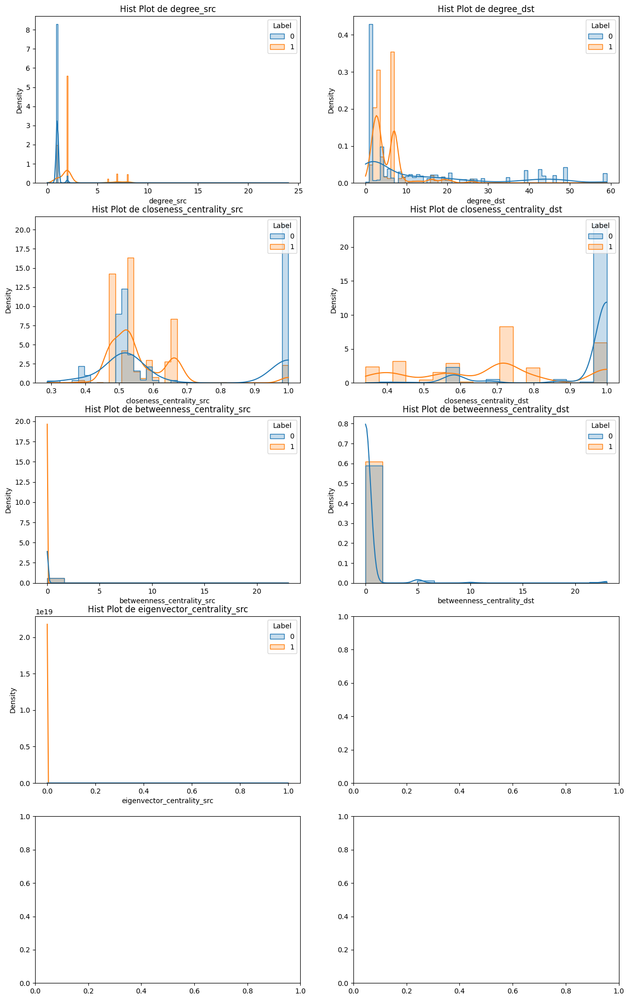

In [80]:
new_variables = ['degree_src', 'degree_dst', 'closeness_centrality_src', 'closeness_centrality_dst',
                 'betweenness_centrality_src', 'betweenness_centrality_dst', 'eigenvector_centrality_src',
                 'eigenvector_centrality_dst',
                 'pagerank_src', 'pagerank_dst']

# Configuration de la figure pour afficher les graphiques côte à côte
rows = len(new_variables) // 2 if len(new_variables) % 2 == 0 else len(new_variables) // 2 + 1
fig, axes = plt.subplots(rows, 2, figsize=(15, 5 * rows))

# Assurer que la colonne 'Label' existe dans update_df
if 'Label' in update_df.columns:
    for i, var in enumerate(new_variables):
        row, col = i // 2, i % 2
        sns.histplot(data=update_df, x=var, hue='Label', kde=True, element="step", stat="density", common_norm=False, ax=axes[row, col])
        axes[row, col].set_title(f'Hist Plot de {var}')

    # Ajustement de l'espacement
    plt.tight_layout()
    plt.show()
else:
    print("La colonne 'Label' est manquante dans le DataFrame.")


ValueError: array is too big; `arr.size * arr.dtype.itemsize` is larger than the maximum possible size.

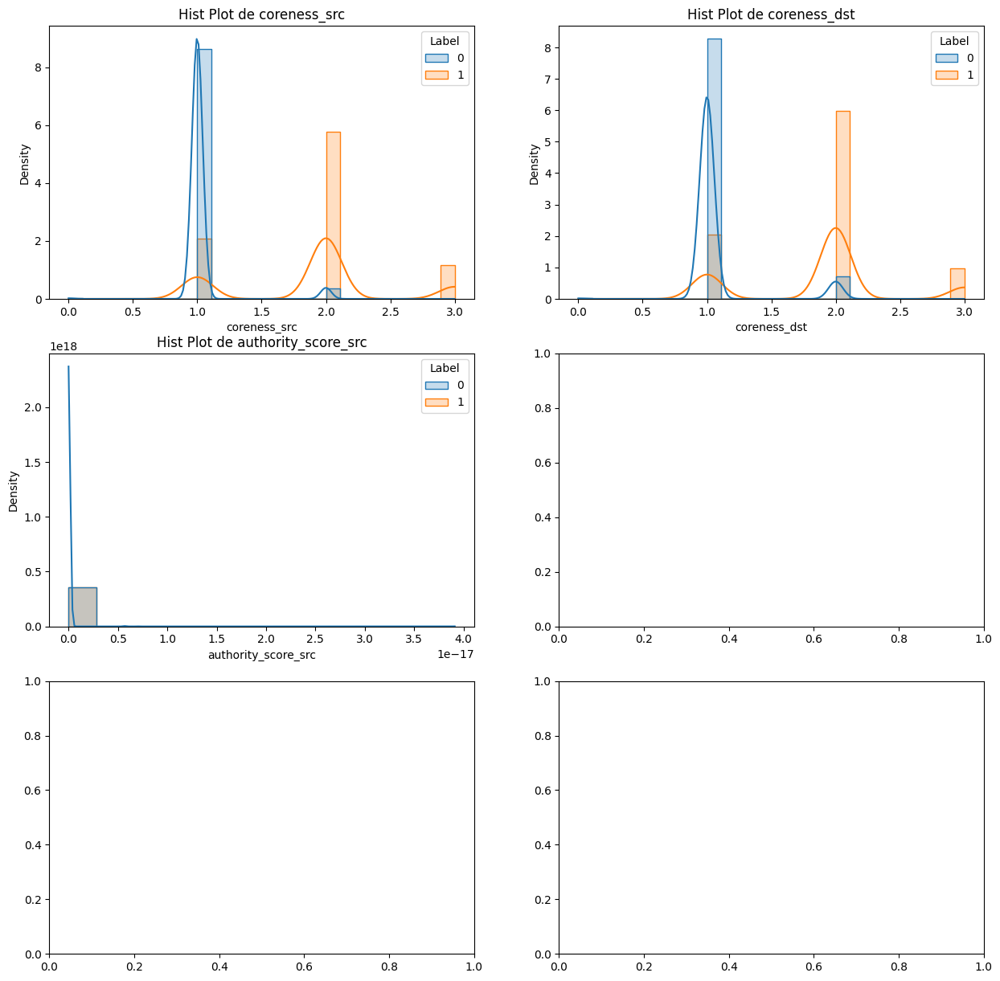

In [78]:
new_variables = ['coreness_src', 'coreness_dst',
       'authority_score_src', 'authority_score_dst', 'hub_score_src',
       'hub_score_dst']

# Configuration de la figure pour afficher les graphiques côte à côte
rows = len(new_variables) // 2 if len(new_variables) % 2 == 0 else len(new_variables) // 2 + 1
fig, axes = plt.subplots(rows, 2, figsize=(15, 5 * rows))

# Assurer que la colonne 'Label' existe dans update_df
if 'Label' in update_df.columns:
    for i, var in enumerate(new_variables):
        row, col = i // 2, i % 2
        sns.histplot(data=update_df, x=var, hue='Label', kde=True, element="step", stat="density", common_norm=False, ax=axes[row, col])
        axes[row, col].set_title(f'Hist Plot de {var}')

    # Ajustement de l'espacement
    plt.tight_layout()
    plt.show()
else:
    print("La colonne 'Label' est manquante dans le DataFrame.")


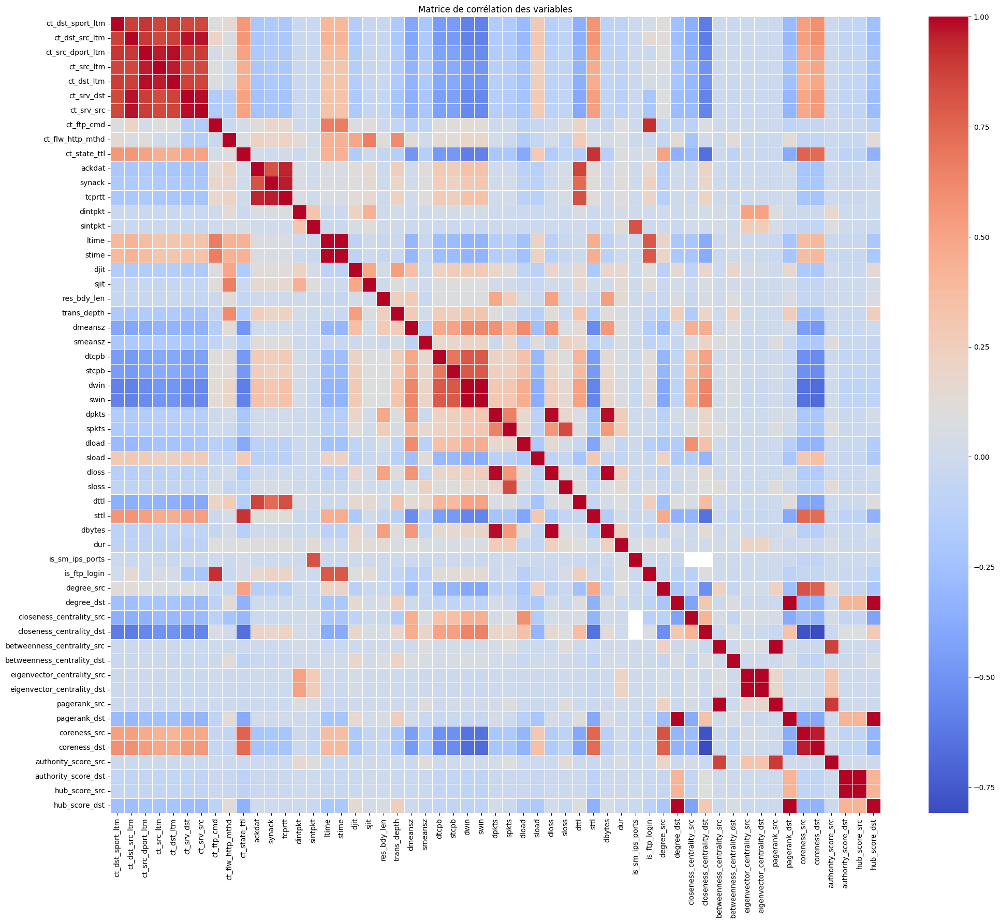

In [81]:
variables_int = ['ct_dst_sport_ltm', 'ct_dst_src_ltm','ct_src_dport_ltm','ct_src_ltm','ct_dst_ltm','ct_srv_dst','ct_srv_src','ct_ftp_cmd','ct_flw_http_mthd','ct_state_ttl','ackdat','synack','tcprtt','dintpkt',
             'sintpkt','ltime','stime','djit','sjit','res_bdy_len','trans_depth','dmeansz','smeansz','dtcpb','stcpb','dwin','swin','dpkts','spkts','dload','sload','dloss','sloss','dttl','sttl','dbytes','dur','is_sm_ips_ports','is_ftp_login','degree_src', 'degree_dst',
       'closeness_centrality_src', 'closeness_centrality_dst',
       'betweenness_centrality_src', 'betweenness_centrality_dst',
       'eigenvector_centrality_src', 'eigenvector_centrality_dst',
       'pagerank_src', 'pagerank_dst','coreness_src', 'coreness_dst',
       'authority_score_src', 'authority_score_dst', 'hub_score_src',
       'hub_score_dst']

# Calcul de la matrice de corrélation
correlation_matrix_update = update_df[variables_int].corr()

# Création de la carte de chaleur
plt.figure(figsize=(24, 20))
sns.heatmap(correlation_matrix_update, annot=False, cmap='coolwarm', linewidths=.5)
plt.title('Matrice de corrélation des variables')
plt.show()

{'hub_score_src', 'dloss', 'eigenvector_centrality_dst', 'coreness_src', 'ct_srv_src', 'synack', 'ct_src_ltm', 'sttl', 'ct_dst_src_ltm', 'dbytes', 'coreness_dst', 'pagerank_dst', 'sloss', 'ct_srv_dst', 'hub_score_dst', 'dttl', 'pagerank_src', 'swin', 'tcprtt', 'is_sm_ips_ports', 'ct_dst_ltm', 'ct_src_dport_ltm', 'authority_score_src', 'is_ftp_login', 'stime'}


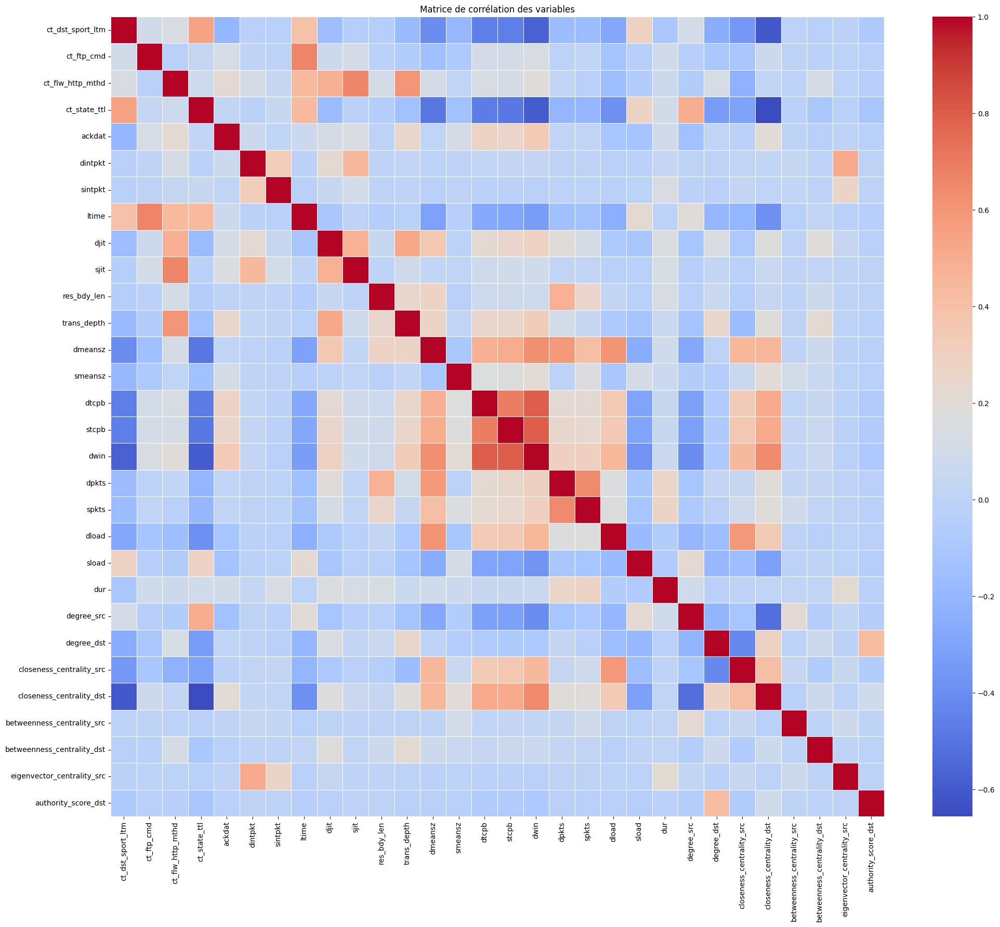

Index(['ct_dst_sport_ltm', 'ct_ftp_cmd', 'ct_flw_http_mthd', 'ct_state_ttl',
       'ackdat', 'dintpkt', 'sintpkt', 'ltime', 'djit', 'sjit', 'res_bdy_len',
       'trans_depth', 'dmeansz', 'smeansz', 'dtcpb', 'stcpb', 'dwin', 'dpkts',
       'spkts', 'dload', 'sload', 'dur', 'degree_src', 'degree_dst',
       'closeness_centrality_src', 'closeness_centrality_dst',
       'betweenness_centrality_src', 'betweenness_centrality_dst',
       'eigenvector_centrality_src', 'authority_score_dst'],
      dtype='object')

In [82]:

# Calcul de la matrice de corrélation
corr_matrix = update_df[variables_int].corr()

# Trouver les paires de variables fortement corrélées (au-dessus de 0.8)
to_drop = set()
for i in range(len(corr_matrix.columns)):
    for j in range(i+1, len(corr_matrix.columns)):
        if abs(corr_matrix.iloc[i, j]) > 0.8:
            # Si la corrélation est forte, ajouter l'un des deux à la liste des colonnes à supprimer
            to_drop.add(corr_matrix.columns[j])

# Afficher les paires de variables fortement corrélées
print(to_drop)

# Éliminer les variables fortement corrélées
update_df_reduced = update_df[variables_int].drop(columns=to_drop)

new_colonnes = update_df_reduced.columns

# Calcul de la matrice de corrélation
correlation_matrix = update_df_reduced.corr()

# Création de la carte de chaleur
plt.figure(figsize=(24, 20))
sns.heatmap(correlation_matrix, annot=False, cmap='coolwarm', linewidths=.5)
plt.title('Matrice de corrélation des variables')
plt.show()

# Afficher les colonnes restantes
update_df_reduced.columns

In [83]:
int_keep_columns = update_df_reduced.columns
final_update_df = update_df_reduced
final_update_df['Label'] = update_df['Label']
# add nominal columns
final_update_df['proto'] = update_df['proto']
final_update_df['state'] = update_df['state']
final_update_df['service'] = update_df['service']
int_keep_columns

Index(['ct_dst_sport_ltm', 'ct_ftp_cmd', 'ct_flw_http_mthd', 'ct_state_ttl',
       'ackdat', 'dintpkt', 'sintpkt', 'ltime', 'djit', 'sjit', 'res_bdy_len',
       'trans_depth', 'dmeansz', 'smeansz', 'dtcpb', 'stcpb', 'dwin', 'dpkts',
       'spkts', 'dload', 'sload', 'dur', 'degree_src', 'degree_dst',
       'closeness_centrality_src', 'closeness_centrality_dst',
       'betweenness_centrality_src', 'betweenness_centrality_dst',
       'eigenvector_centrality_src', 'authority_score_dst'],
      dtype='object')

In [84]:
print(final_update_df.isnull().sum())

ct_dst_sport_ltm                 0
ct_ftp_cmd                    3755
ct_flw_http_mthd              3555
ct_state_ttl                     0
ackdat                           0
dintpkt                          0
sintpkt                          0
ltime                            0
djit                             0
sjit                             0
res_bdy_len                      0
trans_depth                      0
dmeansz                          0
smeansz                          0
dtcpb                            0
stcpb                            0
dwin                             0
dpkts                            0
spkts                            0
dload                            0
sload                            0
dur                              0
degree_src                       0
degree_dst                       0
closeness_centrality_src         6
closeness_centrality_dst         6
betweenness_centrality_src       0
betweenness_centrality_dst       0
eigenvector_centrali

In [85]:
final_update_df['closeness_centrality_src'] = final_update_df['closeness_centrality_src'].fillna(final_update_df['closeness_centrality_src'].mean())
final_update_df['closeness_centrality_dst'] = final_update_df['closeness_centrality_dst'].fillna(final_update_df['closeness_centrality_dst'].mean())

In [86]:
# Initialisation du MinMaxScaler.
scaler = MinMaxScaler()

# Normalisation des colonnes numériques spécifiées dans variables.
final_update_df[int_keep_columns] = scaler.fit_transform(final_update_df[int_keep_columns])

# drop columns with lots of null values 
final_update_df = final_update_df.drop(['ct_ftp_cmd'], axis=1)
final_update_df = final_update_df.drop(['ct_flw_http_mthd'], axis=1)

In [87]:

# Séparation des données en ensembles d'entraînement et de test
X = final_update_df.drop(columns='Label')
y = final_update_df['Label']

# Création de variables dummy pour les variables catégorielles
X_dummies = pd.get_dummies(X, drop_first=True)

# Séparation des données en ensembles d'entraînement et de test après avoir créé des variables dummy
X_train, X_test, y_train, y_test = train_test_split(X_dummies, y, test_size=0.2, random_state=42)

# Entraînement du modèle SVM avec un noyau radial ('rbf' est le choix par défaut)
svm_model = SVC(kernel='rbf')
svm_model.fit(X_train, y_train)

# Prédictions sur l'ensemble de test
y_pred = svm_model.predict(X_test)

# Évaluation du modèle
print("Confusion Matrix update df:")
print(confusion_matrix(y_test, y_pred))
print("\nClassification Report update df:")
print(classification_report(y_test, y_pred))



Confusion Matrix update df:
[[513   7]
 [  0 523]]

Classification Report update df:
              precision    recall  f1-score   support

           0       1.00      0.99      0.99       520
           1       0.99      1.00      0.99       523

    accuracy                           0.99      1043
   macro avg       0.99      0.99      0.99      1043
weighted avg       0.99      0.99      0.99      1043



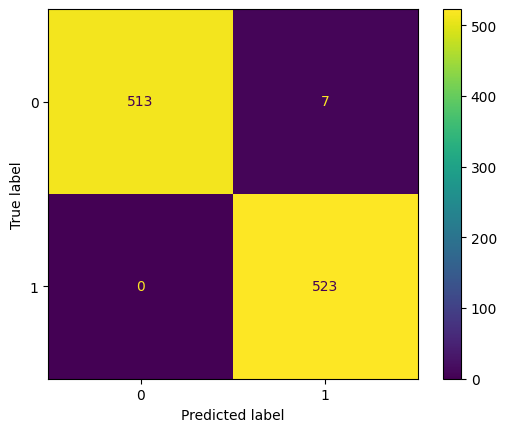

In [88]:

# Créez une matrice de confusion
cm = confusion_matrix(y_test, y_pred)
# Afficher la matrice de confusion
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=svm_model.classes_)
disp.plot()



In [89]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report

# Assurer que la colonne 'Label' existe dans votre DataFrame
if 'Label' in final_update_df.columns:
    # Séparation des données en ensembles d'entraînement et de test
    X = final_update_df.drop(columns='Label')
    y = final_update_df['Label']

    # Création de variables dummy pour les variables catégorielles
    X_dummies = pd.get_dummies(X, drop_first=True)

    # Séparation des données
    X_train, X_test, y_train, y_test = train_test_split(X_dummies, y, test_size=0.2, random_state=42)

    # Entraînement du modèle Random Forest
    rf_model = RandomForestClassifier(random_state=42)
    rf_model.fit(X_train, y_train)

    # Prédictions et évaluation
    y_pred = rf_model.predict(X_test)
    #print("Confusion Matrix update df:")
    #print(confusion_matrix(y_test, y_pred))
    #print("\nClassification Report update df:")
    #print(classification_report(y_test, y_pred))

    # Afficher l'importance des variables
    feature_importances = rf_model.feature_importances_
    importance_df = pd.DataFrame({'Feature': X_dummies.columns, 'Importance': feature_importances})
    print("\nFeature Importances:")
    print(importance_df.sort_values(by='Importance', ascending=False))
else:
    print("La colonne 'Label' est manquante dans le DataFrame.")



Feature Importances:
           Feature  Importance
1     ct_state_ttl    0.266078
10         dmeansz    0.114741
11         smeansz    0.062643
122      state_INT    0.058840
20      degree_src    0.054180
..             ...         ...
43       proto_egp    0.000000
66      proto_l2tp    0.000000
65   proto_iso-tp4    0.000000
64      proto_isis    0.000000
111  proto_trunk-2    0.000000

[135 rows x 2 columns]



Feature Importances:
           Feature  Importance
1     ct_state_ttl    0.266078
10         dmeansz    0.114741
11         smeansz    0.062643
122      state_INT    0.058840
20      degree_src    0.054180
..             ...         ...
43       proto_egp    0.000000
66      proto_l2tp    0.000000
65   proto_iso-tp4    0.000000
64      proto_isis    0.000000
111  proto_trunk-2    0.000000

[135 rows x 2 columns]


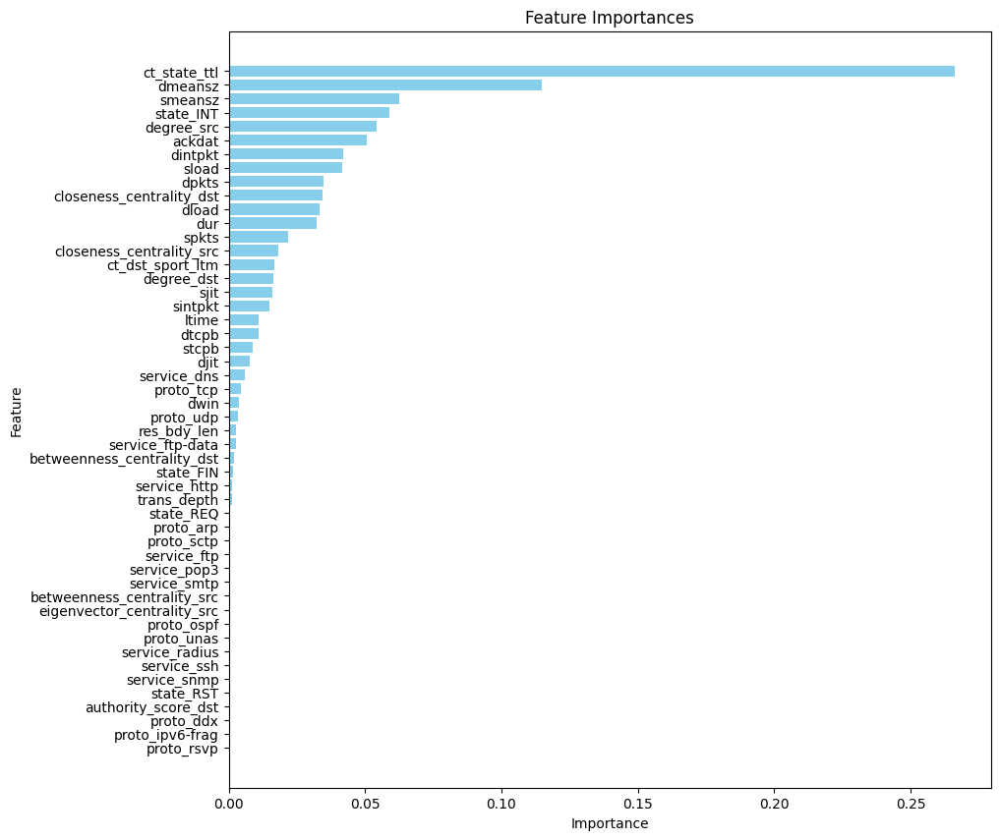

In [92]:
print("\nFeature Importances:")
print(importance_df.sort_values(by='Importance', ascending=False))

# Récupération de l'importance des caractéristiques
feature_importances = rf_model.feature_importances_
importance_df = pd.DataFrame({'Feature': X_dummies.columns, 'Importance': feature_importances})

# Tri des importances pour la visualisation
importance_df_sorted_test = importance_df.sort_values(by='Importance', ascending=False).head(50)

# Création du graphique des 10 caractéristiques les plus importantes
plt.figure(figsize=(10, 10))
plt.barh(importance_df_sorted_test['Feature'], importance_df_sorted_test['Importance'], color='skyblue')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Feature Importances')
plt.gca().invert_yaxis()  # Inverser l'axe Y
plt.show()

In [40]:
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
import torch
import numpy as np

# Sélection des colonnes numériques et catégorielles
num_attribs = [ 'dur', 'sbytes',
       'dbytes', 'sttl', 'dttl', 'sloss', 'dloss', 'sload', 'dload',
       'spkts', 'dpkts', 'swin', 'dwin', 'stcpb', 'dtcpb', 'smeansz',
       'dmeansz', 'trans_depth', 'res_bdy_len', 'sjit', 'djit', 'stime',
       'ltime', 'sintpkt', 'dintpkt', 'tcprtt', 'synack', 'ackdat',
       'is_sm_ips_ports', 'ct_state_ttl', 'ct_flw_http_mthd', 'is_ftp_login',
       'ct_ftp_cmd', 'ct_srv_src', 'ct_srv_dst', 'ct_dst_ltm', 'ct_src_ltm',
       'ct_src_dport_ltm', 'ct_dst_sport_ltm', 'ct_dst_src_ltm']
cat_attribs = ['proto', 'service', 'state']

# Prétraitement pour les pipelines numériques et catégoriels
preprocessor = ColumnTransformer([
    ('num', StandardScaler(), num_attribs),
    ('cat', OneHotEncoder(), cat_attribs),
])

# Fitting et transformation des données
X_array = preprocessor.fit_transform(equilibre_df)

# Vérifiez si X_array est un tableau sparse et convertissez-le en un tableau dense si nécessaire
if hasattr(X_array, "todense"):
    X_array = X_array.todense()

# Convertissez le tableau dense en un tenseur PyTorch
X_tensor = torch.tensor(np.array(X_array), dtype=torch.float)

# Convertissez les étiquettes en un tenseur PyTorch
edge_labels = torch.tensor(equilibre_df['Label'].values, dtype=torch.long)

# Vérification
print("X_tensor shape:", X_tensor.shape)
print("edge_labels shape:", edge_labels.shape)


X_tensor shape: torch.Size([5214, 150])
edge_labels shape: torch.Size([5214])


In [41]:
import torch
from torch_geometric.data import Data
from torch_geometric.nn import GCNConv
import torch.nn.functional as F

# Définition de la classe de modèle GNN
class GCN(torch.nn.Module):
    def __init__(self, num_node_features, num_classes):
        super(GCN, self).__init__()
        self.conv1 = GCNConv(num_node_features, 16)
        self.conv2 = GCNConv(16, num_classes)

    def forward(self, data):
        x, edge_index = data.x, data.edge_index

        x = F.relu(self.conv1(x, edge_index))
        x = F.dropout(x, training=self.training)
        x = self.conv2(x, edge_index)

        return F.log_softmax(x, dim=1)

# Préparation des données pour PyTorch Geometric
# Vous devez convertir votre graphe 'main_graph' et les caractéristiques des nœuds en tensors PyTorch
edge_index = torch.tensor(main_graph.get_edgelist(), dtype=torch.long).t().contiguous()
x = X_tensor

# Les labels des arêtes doivent être ajoutés. Par exemple, 1 pour 'attaque' et 0 pour 'non-attaque'
edge_labels = edge_labels

data = Data(x=x, edge_index=edge_index)

# Initialisation et entraînement du modèle
model = GCN(num_node_features=x.size(1), num_classes=2)  # 2 classes : attaque et non-attaque

optimizer = torch.optim.Adam(model.parameters(), lr=0.01)
criterion = torch.nn.CrossEntropyLoss()

for epoch in range(200):
    optimizer.zero_grad()
    out = model(data)
    loss = criterion(out, edge_labels)
    loss.backward()
    optimizer.step()

    if epoch % 10 == 0:
        print(f'Epoch {epoch}, Loss: {loss.item()}')


Epoch 0, Loss: nan
Epoch 10, Loss: nan
Epoch 20, Loss: nan
Epoch 30, Loss: nan
Epoch 40, Loss: nan
Epoch 50, Loss: nan
Epoch 60, Loss: nan
Epoch 70, Loss: nan
Epoch 80, Loss: nan
Epoch 90, Loss: nan
Epoch 100, Loss: nan
Epoch 110, Loss: nan
Epoch 120, Loss: nan
Epoch 130, Loss: nan
Epoch 140, Loss: nan
Epoch 150, Loss: nan
Epoch 160, Loss: nan
Epoch 170, Loss: nan
Epoch 180, Loss: nan
Epoch 190, Loss: nan
